# Biometric Systems - Laboratory 3

In [2]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import io, filters
from sklearn.metrics import mean_squared_error, mean_absolute_error
from PIL import Image
from sklearn.cluster import KMeans
from scipy.ndimage import median_filter, gaussian_filter
from skimage.morphology import skeletonize
from skimage import measure

In [4]:
# Create lists of images sorted by name
def get_sorted_images(folder_path):
    """Retrieve and sort image paths from a folder (case-insensitively)."""
    return sorted(
        [os.path.join(folder_path, f) for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))],
        key=lambda x: os.path.basename(x).lower()
    )

grayscale_images = get_sorted_images("Grayscale_Images")
grayscale_noisy_images = get_sorted_images("Grayscale_Noisy_Images")
rgb_noisy_images = get_sorted_images("RGB_Noisy_Images")

## Pseudo-Color Techniques
This section demonstrates the use of pseudo-coloring to enhance grayscale images by mapping intensity values to colors.

### Testing

In [150]:
def intensity_slicing_pseudo_coloring(image_path, colormap, n_slices_list):
    """
    Applies intensity slicing with pseudo-coloring to a grayscale image for multiple slice counts.

    Args:
        image_path (str): Path to the input image.
        colormap (str): Colormap to use (e.g., 'jet', 'hot', 'viridis').
        n_slices_list (list): List of numbers of intensity slices (e.g., [4, 6, 8, 12]).

    Returns:
        dict: Dictionary of pseudo-colored images with the number of slices as keys.
    """
    # Load the image and handle GIF files
    if image_path.lower().endswith('.gif'):
        try:
            pil_image = Image.open(image_path).convert('L')  # Convert GIF to grayscale
            image = np.array(pil_image)
        except Exception as e:
            print(f"Error loading GIF image: {e}")
            return None
    else:
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Error: Unable to load image at {image_path}. Please check the file path.")
        return None

    pseudo_colored_images = {}

    for n_slices in n_slices_list:
        # Flatten the image for clustering
        pixel_values = image.ravel().reshape(-1, 1)

        # Apply K-Means clustering to determine intensity slices
        kmeans = KMeans(n_clusters=n_slices, random_state=42)
        kmeans.fit(pixel_values)
        
        # Get cluster centers and sort them
        centers = np.sort(kmeans.cluster_centers_.flatten())

        # Define thresholds as midpoints between cluster centers
        thresholds = [(centers[i] + centers[i+1]) / 2 for i in range(len(centers) - 1)]
        thresholds = [0] + thresholds + [255]  # Include min and max bounds

        # Create a colormap
        cmap = plt.get_cmap(colormap)
        colormap_values = cmap(np.linspace(0, 1, n_slices))

        # Map each pixel to its corresponding slice
        colored_image = np.zeros((*image.shape, 3))  # RGB output
        for i in range(n_slices):
            mask = (image >= thresholds[i]) & (image < thresholds[i+1])
            colored_image[mask] = colormap_values[i, :3]  # Assign RGB values

        # Scale to 0-255 for proper display
        colored_image = (colored_image * 255).astype(np.uint8)
        pseudo_colored_images[n_slices] = colored_image

    return pseudo_colored_images

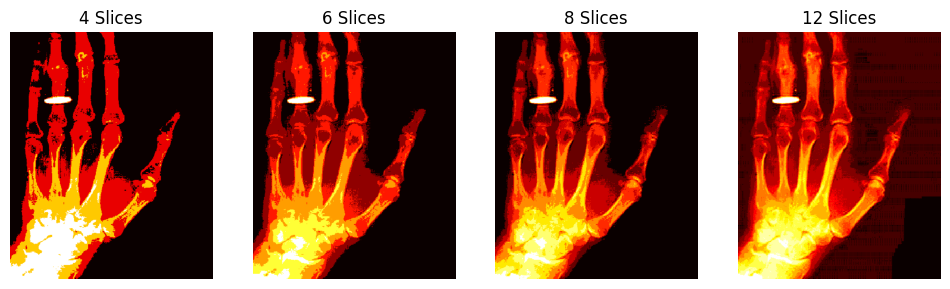

In [151]:
# Example Usage
image_path = grayscale_images[11]  # Replace with your image path
colormap = 'hot'  # Choose colormap
slices_list = [4, 6, 8, 12]  # Number of intensity slices

# Apply intensity slicing with pseudo-coloring
pseudo_colored_images = intensity_slicing_pseudo_coloring(image_path, colormap, slices_list)

# Plot the results
plt.figure(figsize=(12,10))
for idx in range(len(slices_list)):
    plt.subplot(1, len(slices_list), idx + 1)
    plt.imshow(pseudo_colored_images[slices_list[idx]])
    plt.axis('off')
    plt.title(f"{slices_list[idx]} Slices")

plt.show()

### Results

In [152]:
# Function to apply intensity slicing and pseudo-coloring
def apply_intensity_slicing(image, colormap, n_slices):
    """
    Applies intensity slicing with pseudo-coloring to a grayscale image.

    Args:
        image (numpy.ndarray): Grayscale image.
        colormap (str): Colormap to use.
        n_slices (int): Number of intensity slices.

    Returns:
        numpy.ndarray: Pseudo-colored image.
    """
    # Flatten the image for clustering
    pixel_values = image.ravel().reshape(-1, 1)

    # Apply K-Means clustering to determine intensity slices
    kmeans = KMeans(n_clusters=n_slices, random_state=42)
    kmeans.fit(pixel_values)
    
    # Get cluster centers and sort them
    centers = np.sort(kmeans.cluster_centers_.flatten())

    # Define thresholds as midpoints between cluster centers
    thresholds = [(centers[i] + centers[i+1]) / 2 for i in range(len(centers) - 1)]
    thresholds = [0] + thresholds + [255]  # Include min and max bounds

    # Create a colormap
    cmap = plt.get_cmap(colormap)
    colormap_values = cmap(np.linspace(0, 1, n_slices))

    # Map each pixel to its corresponding slice
    colored_image = np.zeros((*image.shape, 3))  # RGB output
    for i in range(n_slices):
        mask = (image >= thresholds[i]) & (image < thresholds[i+1])
        colored_image[mask] = colormap_values[i, :3]  # Assign RGB values

    # Scale to 0-255 for proper display
    colored_image = (colored_image * 255).astype(np.uint8)

    return colored_image

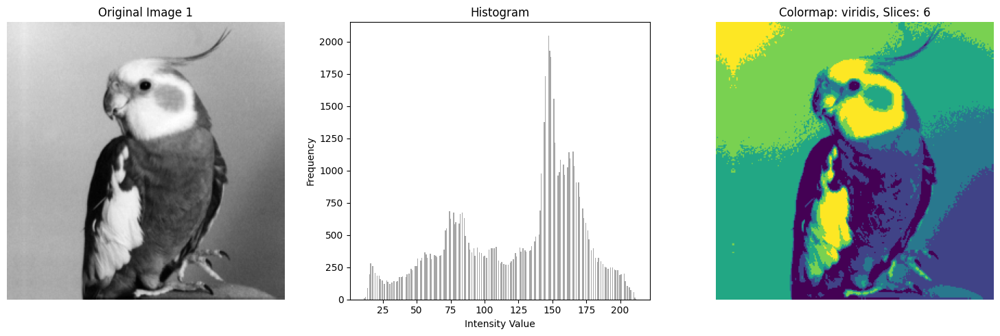

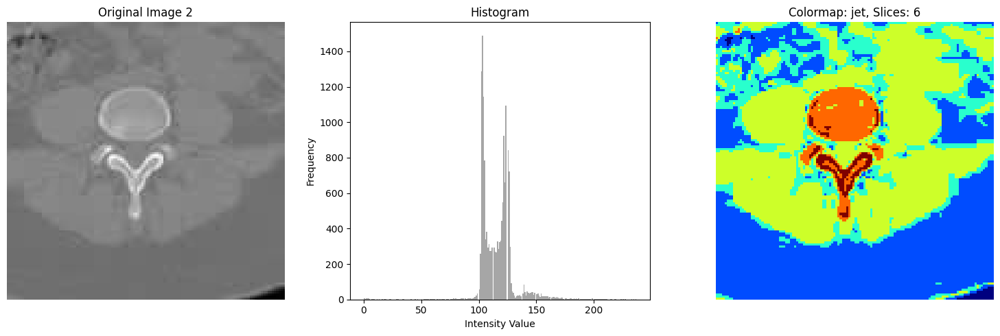

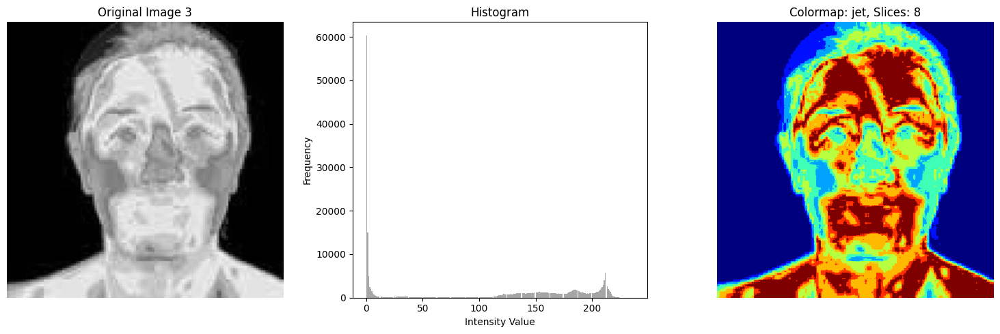

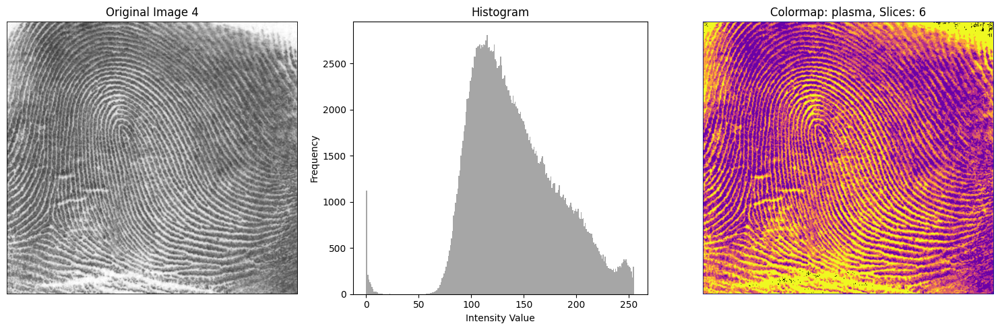

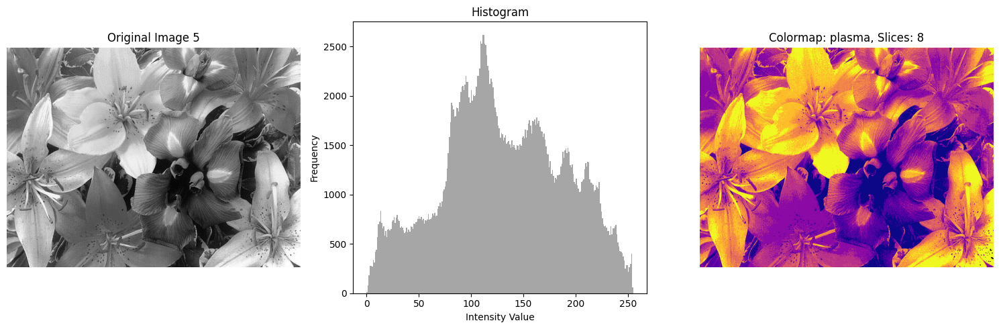

...

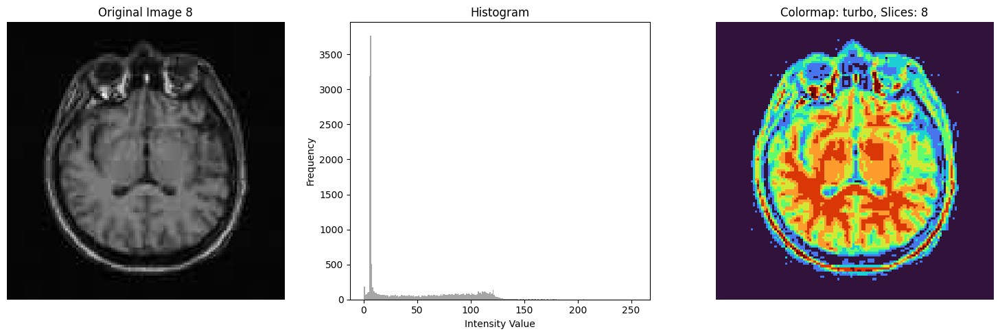

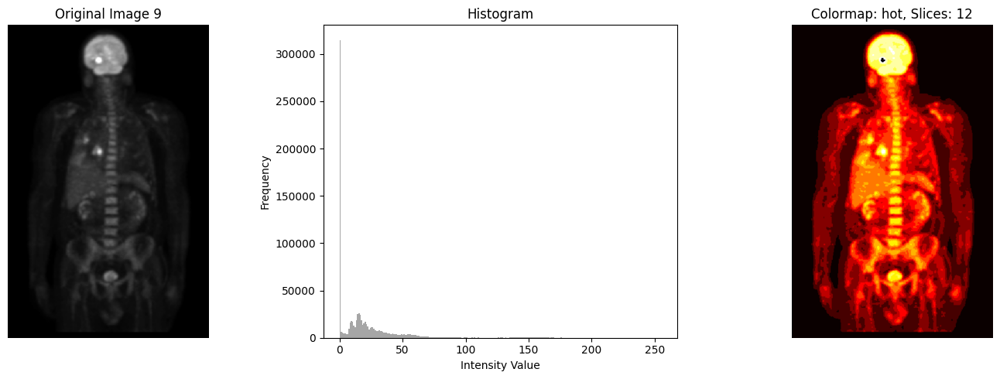

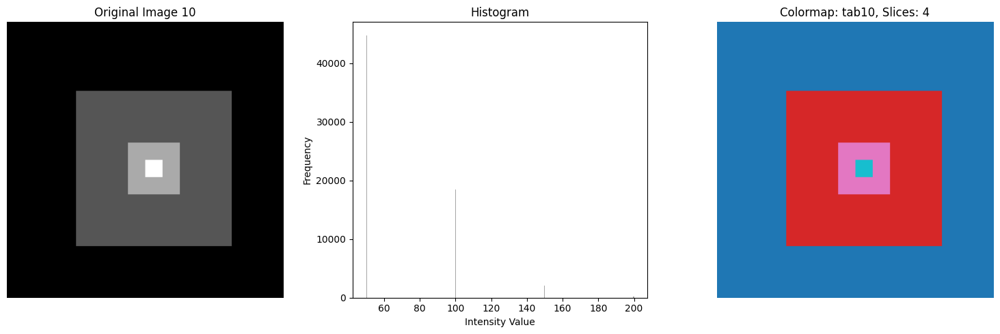

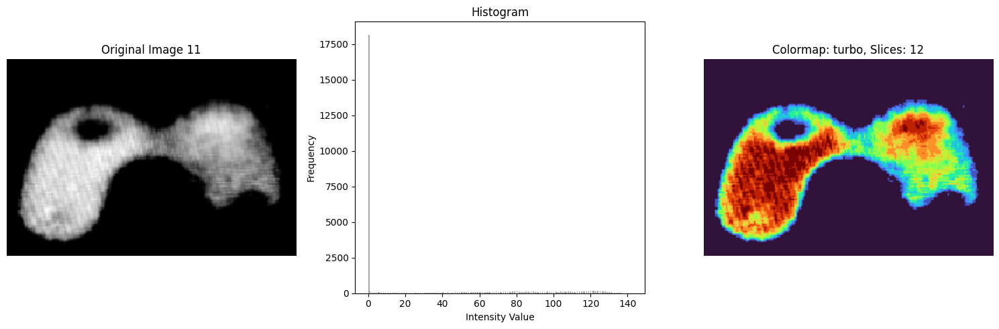

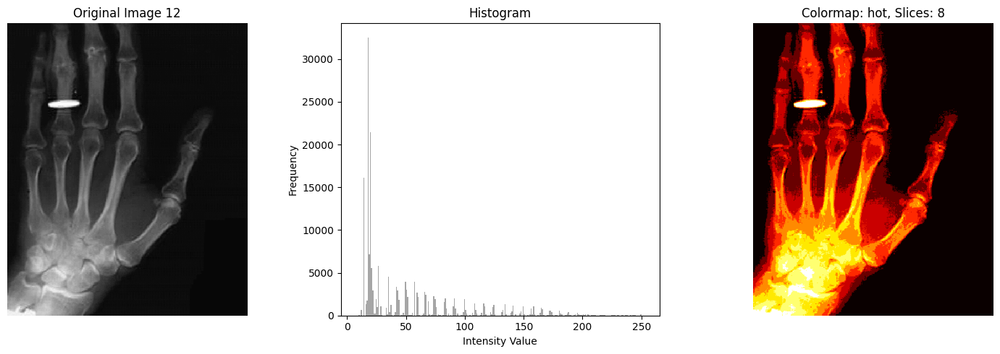

In [153]:
# Define colormaps and number of slices for each image
colormaps = ['viridis', 'jet', 'jet', 'plasma', 'plasma', 'cividis', 'turbo', 'turbo', 'hot', 'tab10', 'turbo', 'hot']
n_slices = [6, 6, 8, 6, 8, 12, 12, 8, 12, 4, 12, 8]

# Plot original, histogram, and modified images
for idx, path in enumerate(grayscale_images):
    # Load the image, handling GIFs
    if path.endswith('.gif'):
        img = np.array(Image.open(path).convert('L'))  # Convert GIF to grayscale
    else:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

    # Apply the slicing function
    colormap = colormaps[idx]
    slices = n_slices[idx]
    pseudo_colored_image = apply_intensity_slicing(img, colormap, slices)

    # Plot the original image
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.title(f"Original Image {idx+1}")

    # Plot the histogram
    plt.subplot(1, 3, 2)
    plt.hist(img.ravel(), bins=256, color='gray', alpha=0.7)
    plt.title("Histogram")
    plt.xlabel("Intensity Value")
    plt.ylabel("Frequency")

    # Plot the pseudo-colored image
    plt.subplot(1, 3, 3)
    plt.imshow(pseudo_colored_image)
    plt.axis('off')
    plt.title(f"Colormap: {colormap}, Slices: {slices}")

    plt.tight_layout()
    plt.show()


### Comment
#### `bird.gif`
The chosen technique is intensity slicing with the jet colormap using 6 slices. The pseudo-coloring effectively separates the background and highlights the bird's feathers and body with distinct color transitions. The quality of the results is good, as the bird's features are well-emphasized, though the abrupt color changes in the jet colormap could exaggerate intensity differences.
#### `CT.jpg`
The chosen technique uses the jet colormap with 6 slices. The pseudo-coloring effectively highlights the distinct intensity regions, particularly the central bright structure and surrounding areas. However, the abrupt transitions in the jet colormap may exaggerate some details, making it harder to interpret subtle transitions. While it separates key regions well, a smoother colormap like viridis could provide more accurate visual representation for medical imaging. The results are good but could be improved for finer gradients.
#### `face_thermogram.png`
The chosen technique uses the jet colormap with 8 slices. The pseudo-coloring successfully separates the warmer and cooler areas of the face, highlighting intensity differences. However, the jet colormap's abrupt transitions may exaggerate the high-intensity areas, like the central face, making the representation less accurate. A perceptually uniform colormap might better preserve the image's subtleties, although losing in details.
#### `finger.png`
The chosen technique uses the plasma colormap with 6 slices. The pseudo-coloring effectively highlights the fingerprint's ridges and valleys, emphasizing the contrast between them. Plasma's smooth gradient enhances the details without overwhelming the image, making this a good choice for this application. The results are visually appealing and accurate.
#### `flowers.bmp`
The chosen technique uses the plasma colormap with 8 slices. The pseudo-coloring enhances the flowers' textures and patterns, separating the petals and shadows effectively. Plasma provides a smooth and visually appealing result, and the 8 slices balance detail and simplicity well. The results are both accurate and aesthetically pleasing.
#### `goldhill.bmp`
The chosen technique uses the cividis colormap with 12 slices. The pseudo-coloring effectively separates different intensity levels, highlighting the houses and landscape details. The cividis colormap provides smooth transitions and good perceptual uniformity, making the result easy to interpret. The quality of the results is good, as it balances detail and clarity.
#### `iris.png`
The chosen technique uses the turbo colormap with 12 slices. The pseudo-coloring highlights the iris's intricate patterns and separates regions of varying intensity. The turbo colormap provides vibrant color transitions, enhancing the radial details effectively. The result is visually striking and captures fine details well.
#### `MR.jpg`
The chosen technique uses the turbo colormap with 8 slices. The pseudo-coloring enhances the MRI's brain structures, effectively separating intensity levels. The turbo colormap provides strong contrasts, but finer slicing might capture subtler details in medical interpretation. However, this produces more noise in the surrounding background.
#### `PET.png`
The chosen technique uses the hot colormap with 12 slices. The pseudo-coloring effectively emphasizes high-intensity regions (e.g., the brain and metabolic hotspots), which are important in PET scans. The hot colormap is well-suited for this type of imaging, as it mimics heatmaps. The results are highly effective for highlighting critical regions.
#### `squares.gif` 
The chosen technique uses the tab10 colormap with 4 slices. The pseudo-coloring separates the four intensity levels of the squares effectively. Since the image has distinct and well-separated intensity regions, any colormap could work well for this application. The results are accurate and visually clear.
#### `Thyroid.tif`
The chosen technique uses the turbo colormap with 12 slices. The pseudo-coloring highlights the subtle intensity variations within the structure, emphasizing the brighter regions while maintaining detail in darker areas. The turbo colormap works effectively, and the 12 slices capture sufficient detail. The result is detailed and visually clear.
#### `XRay.png`
The chosen technique uses the hot colormap with 8 slices. The pseudo-coloring effectively emphasizes the bones and metallic object, clearly separating the background and brighter regions. The hot colormap is well-suited for this X-ray image, as it highlights key features like bone density and metallic elements. The results are both functional and visually clear.

## Grayscale Images Analysis and Restoration

In [154]:
def plot_images_with_histograms(image_paths, group_size):
    """
    Display images with their histograms below, grouped in sets of `group_size`.

    Args:
        image_paths (list): List of paths to the grayscale images.
        group_size (int): Number of images to display per figure.
    """
    # Divide the images into chunks of `group_size`
    chunks = [image_paths[i:i + group_size] for i in range(0, len(image_paths), group_size)]

    for chunk_index, chunk in enumerate(chunks):
        # Create a figure with 2 rows: images and histograms
        num_images = len(chunk)
        fig, axes = plt.subplots(2, num_images, figsize=(15, 6))
        fig.suptitle(f"Group {chunk_index + 1}", fontsize=16)

        for i, image_path in enumerate(chunk):
            # Read the image in grayscale
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            
            # Plot the image
            axes[0, i].imshow(img, cmap='gray')
            axes[0, i].axis('off')
            axes[0, i].set_title(f"Image {os.path.basename(image_path)}")

            # Calculate and plot the histogram
            hist, bins = np.histogram(img.ravel(), bins=256, range=[0, 256])
            axes[1, i].bar(bins[:-1], hist, width=1, color='black')
            axes[1, i].set_xlim([0, 256])
            axes[1, i].set_title("Histogram")

        # Adjust layout
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

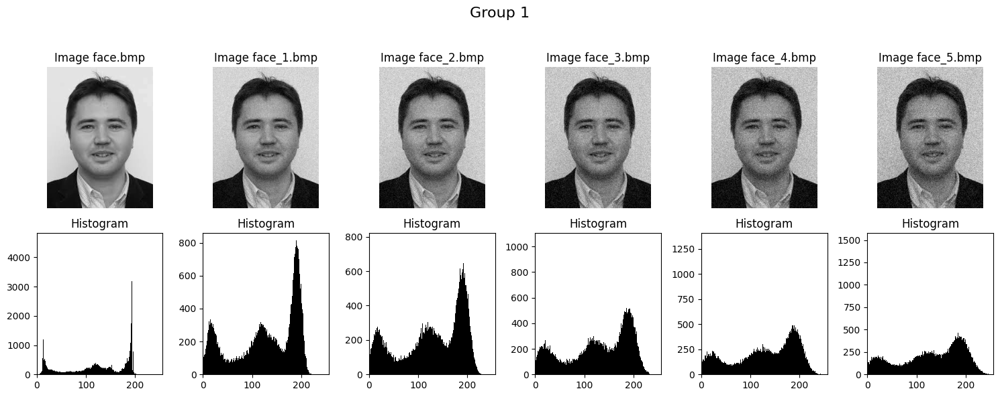

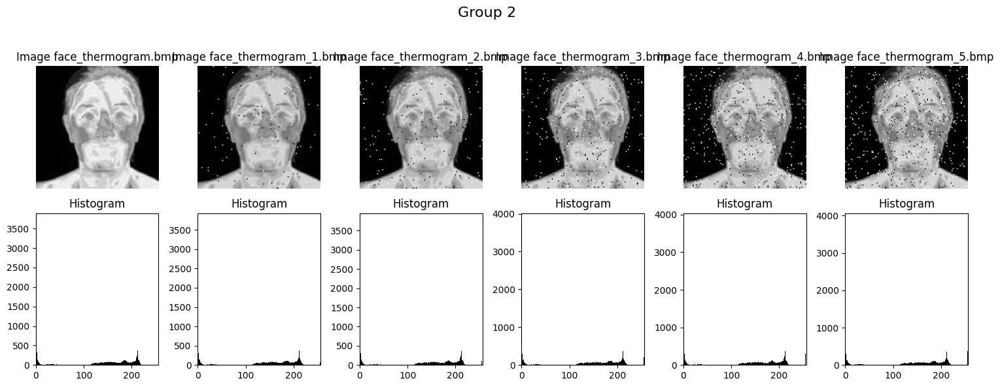

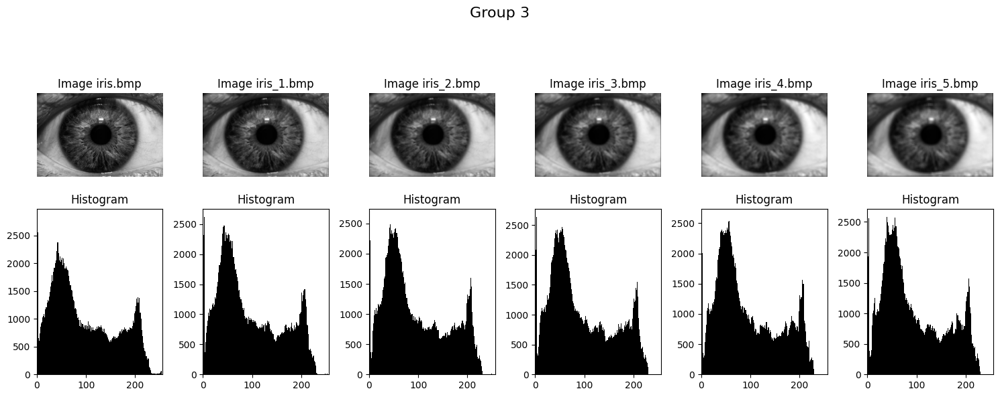

In [155]:
# Grayscale
plot_images_with_histograms(grayscale_noisy_images, group_size=6)

### `face.bmp`

In [156]:
def restore_images(noisy_images_gs, original_image_path):
    """Restore noisy grayscale images and plot them alongside the noisy versions."""
    # Load the original image
    original_image = np.array(Image.open(original_image_path).convert("L"))

    # Load the noisy images
    noisy_images = [np.array(Image.open(img_path).convert("L")) for img_path in noisy_images_gs]

    # Techniques for restoration based on noise levels
    restored_images = []
    techniques = []
    mse_list = []
    mae_list = []

    for i, noisy_image in enumerate(noisy_images):  # Process all images in the list
        if i == 0:
            restored_image = median_filter(noisy_image, size=3)
            techniques.append("Median filter (size=3)")
        elif i == 1:
            restored_image = median_filter(noisy_image, size=5)
            techniques.append("Median filter (size=5)")
        elif i == 2:
            restored_image = gaussian_filter(noisy_image, sigma=1.5)
            techniques.append("Gaussian filter (sigma=1.5)")
        elif i == 3:
            intermediate = median_filter(noisy_image, size=5)
            restored_image = gaussian_filter(intermediate, sigma=1.5)
            techniques.append("Combination of median filter (size=5) and Gaussian filter (sigma=1.5)")
        elif i == 4:
            intermediate = median_filter(noisy_image, size=7)
            restored_image = gaussian_filter(intermediate, sigma=2.0)
            techniques.append("Combination of median filter (size=7) and Gaussian filter (sigma=2.0)")
        else:
            restored_image = noisy_image  # Default case
            techniques.append("No restoration applied")

        # Append the restored image to the list
        restored_images.append(restored_image)

        # Calculate MSE and MAE
        mse = np.mean((original_image - restored_image) ** 2)
        mae = np.mean(np.abs(original_image - restored_image))
        mse_list.append(mse)
        mae_list.append(mae)

    # Adjust the number of subplots dynamically to include all images
    fig, axes = plt.subplots(len(restored_images), 2, figsize=(6, 3 * len(restored_images)))

    for i, (noisy_image, restored_image, mse, mae) in enumerate(zip(noisy_images, restored_images, mse_list, mae_list)):
        # Noisy image
        axes[i, 0].imshow(noisy_image, cmap='gray')
        axes[i, 0].set_title(f"Noisy Image {i + 1}")
        axes[i, 0].axis("off")

        # Restored image
        axes[i, 1].imshow(restored_image, cmap='gray')
        axes[i, 1].set_title(f"Restored Image {i + 1}\nMSE: {mse:.2f}, MAE: {mae:.2f}")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

    return techniques, mse_list, mae_list

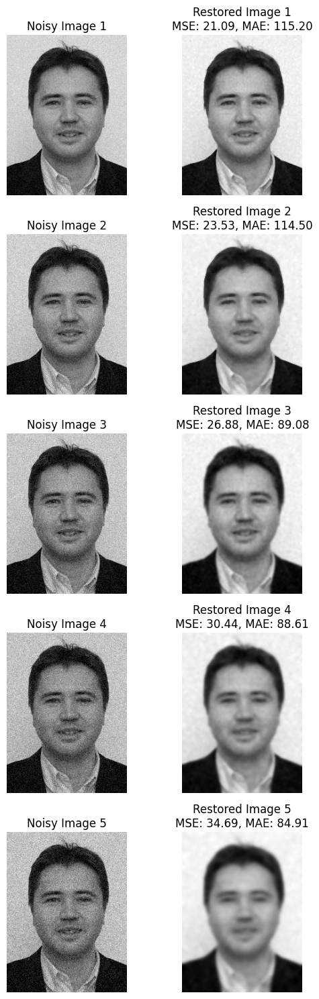

In [157]:
# Example
techniques, mse_list, mae_list = restore_images(grayscale_noisy_images[1:6], grayscale_noisy_images[0])

#### Comment
The restoration techniques (median and Gaussian filters) effectively reduce noise in lightly degraded images but struggle with higher noise levels. As noise increases, the restored images exhibit significant detail loss, over-smoothing, and blurred edges, especially in the last two images. Residual noise remains visible, and histograms show reduced contrast and flattened intensity, indicating a loss of dynamic range. While suitable for basic noise reduction, these techniques fail to balance noise removal and detail preservation for heavily degraded images. Advanced methods like non-local means or deep learning could better handle noise while retaining image quality.

### `face_thermogram.bmp`

In [172]:
def restore_images(noisy_images_gs, original_image_path):
    """Restore noisy thermal images using only median filtering to reduce salt-and-pepper noise."""
    # Load the original image
    original_image = np.array(Image.open(original_image_path).convert("L"))

    # Load the noisy images
    noisy_images = [np.array(Image.open(img_path).convert("L")) for img_path in noisy_images_gs]

    # Techniques for restoration
    restored_images = []
    techniques = []
    mse_list = []
    mae_list = []

    for i, noisy_image in enumerate(noisy_images):  # Process all images in the list
        if i == 0:
            restored_image = median_filter(noisy_image, size=3)
            techniques.append("Median filter (size=3)")
        elif i == 1:
            restored_image = median_filter(noisy_image, size=3)
            techniques.append("Median filter (size=3)")
        elif i == 2:
            restored_image = median_filter(noisy_image, size=3)
            techniques.append("Median filter (size=3)")
        elif i == 3:
            restored_image = median_filter(noisy_image, size=3)
            techniques.append("Median filter (size=3)")
        elif i == 4:
            restored_image = median_filter(noisy_image, size=3)
            techniques.append("Median filter (size=3)")
        else:
            restored_image = noisy_image  # Default case (not expected)
            techniques.append("No restoration applied")

        # Append the restored image to the list
        restored_images.append(restored_image)

        # Calculate MSE and MAE
        mse = np.mean((original_image - restored_image) ** 2)
        mae = np.mean(np.abs(original_image - restored_image))
        mse_list.append(mse)
        mae_list.append(mae)

    # Plot noisy and restored images side by side
    fig, axes = plt.subplots(len(restored_images), 2, figsize=(6, 3 * len(restored_images)))

    for i, (noisy_image, restored_image, mse, mae) in enumerate(zip(noisy_images, restored_images, mse_list, mae_list)):
        # Noisy image
        axes[i, 0].imshow(noisy_image, cmap='gray')
        axes[i, 0].set_title(f"Noisy Image {i + 1}")
        axes[i, 0].axis("off")

        # Restored image
        axes[i, 1].imshow(restored_image, cmap='gray')
        axes[i, 1].set_title(f"Restored Image {i + 1}\nMSE: {mse:.2f}, MAE: {mae:.2f}")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

    return techniques, mse_list, mae_list

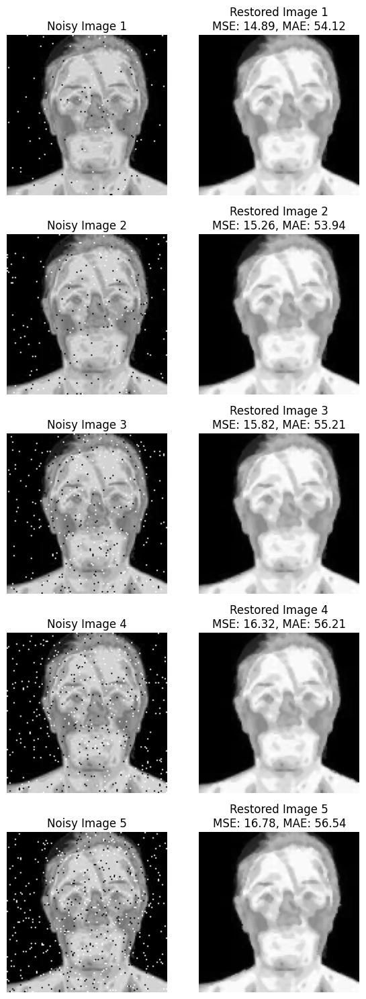

In [173]:
techniques, mse_list, mae_list = restore_images(grayscale_noisy_images[7:12], grayscale_noisy_images[6])

#### Comment
The restoration techniques using median filtering (with a fixed 3x3 kernel) effectively reduce salt-and-pepper noise while maintaining a reasonable level of detail across all images. The restored images show minimal over-smoothing compared to previous methods, preserving sharper edges and structures. While effective for this task, the method may not fully restore heavily corrupted images without introducing visible artifacts.

### `iris.bmp`

In [160]:
def restore_images(noisy_images_gs, original_image_path):
    """Restore iris images using dynamic unsharp masking based on blur level."""
    # Load the original image
    original_image = np.array(Image.open(original_image_path).convert("L"))

    # Load the noisy images
    noisy_images = [np.array(Image.open(img_path).convert("L")) for img_path in noisy_images_gs]

    # Techniques for restoration
    restored_images = []
    techniques = []
    mse_list = []
    mae_list = []

    # Function to measure blur using variance of the Laplacian
    def calculate_blur(image):
        laplacian_var = cv2.Laplacian(image, cv2.CV_64F).var()
        return laplacian_var

    # Apply dynamic unsharp masking
    for noisy_image in noisy_images:
        # Measure blur level
        blur_level = calculate_blur(noisy_image)
        
        # Determine alpha dynamically
        alpha = 1.0 + (250 / (blur_level + 1))
        
        # Apply Gaussian blur
        gaussian_blur_ksize = 5
        blurred = cv2.GaussianBlur(noisy_image.astype(np.float32), (gaussian_blur_ksize, gaussian_blur_ksize), 0)

        # Perform unsharp masking
        mask = noisy_image - blurred
        restored_image = noisy_image + alpha * mask

        # Clip values to valid range
        restored_image = np.clip(restored_image, 0, 255).astype(np.uint8)

        # Save restored image and technique description
        restored_images.append(restored_image)
        techniques.append(f"Unsharp Masking (alpha={alpha:.2f})")

        # Calculate MSE and MAE
        mse = np.mean((original_image - restored_image) ** 2)
        mae = np.mean(np.abs(original_image - restored_image))
        mse_list.append(mse)
        mae_list.append(mae)

    # Plot noisy and restored images side by side
    fig, axes = plt.subplots(len(restored_images), 2, figsize=(6, 4 * len(restored_images)))

    for i, (noisy_image, restored_image, mse, mae) in enumerate(zip(noisy_images, restored_images, mse_list, mae_list)):
        # Noisy image
        axes[i, 0].imshow(noisy_image, cmap='gray')
        axes[i, 0].set_title(f"Noisy Image {i + 1}")
        axes[i, 0].axis("off")

        # Restored image
        axes[i, 1].imshow(restored_image, cmap='gray')
        axes[i, 1].set_title(f"Restored Image {i + 1}\nMSE: {mse:.2f}, MAE: {mae:.2f}")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

    return techniques, mse_list, mae_list

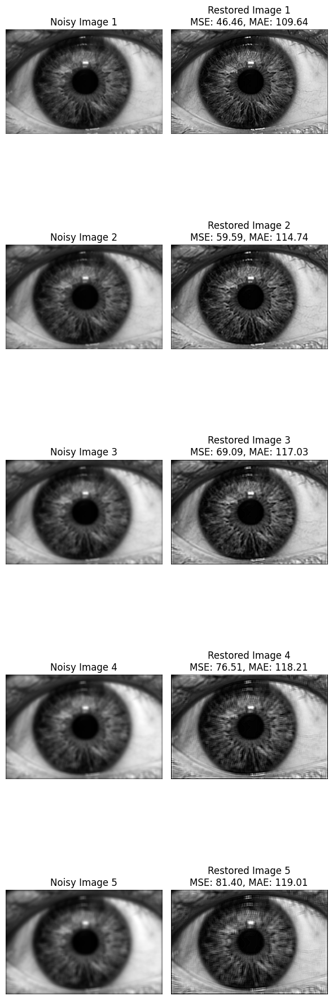

In [161]:
# Example
techniques, mse_list, mae_list = restore_images(grayscale_noisy_images[13:18], grayscale_noisy_images[12])

#### Comment
The application of dynamic Unsharp Masking effectively enhanced sharpness in images with mild to moderate blur, showing good detail recovery and improved local contrast. However, for more heavily blurred images, the technique exhibited limitations, emphasizing artifacts along edges and producing less natural results. Histogram analysis confirms progressive improvement, but the sharpening intensity was insufficient to compensate for the loss of information in severely degraded images. The technique is suitable for enhancing moderately blurred images but is less effective for extreme degradation, where more advanced approaches would be necessary.

## Color Images Analysis and Restoration

In [166]:
def plot_rgb_images(image_paths, group_size):
    """
    Display RGB images with their histograms below, grouped in sets of `group_size`.

    Args:
        image_paths (list): List of paths to the RGB images.
        group_size (int): Number of images to display per figure.
    """
    # Divide the images into chunks of `group_size`
    chunks = [image_paths[i:i + group_size] for i in range(0, len(image_paths), group_size)]

    for chunk_index, chunk in enumerate(chunks):
        # Create a figure with 2 rows for each image: image and histogram
        num_images = len(chunk)
        fig, axes = plt.subplots(2, num_images, figsize=(5 * num_images, 8))
        fig.suptitle(f"Group {chunk_index + 1}", fontsize=16)

        # Ensure axes is iterable even for a single image
        if num_images == 1:
            axes = np.expand_dims(axes, axis=1)

        for i, image_path in enumerate(chunk):
            # Read the image in RGB
            img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
            
            # Plot the image
            axes[0, i].imshow(img)
            axes[0, i].axis('off')
            axes[0, i].set_title(f"Image {os.path.basename(image_path)}")

            # Compute and plot the histogram
            colors = ('r', 'g', 'b')  # RGB channels
            for channel, color in enumerate(colors):
                hist = cv2.calcHist([img], [channel], None, [256], [0, 256])
                axes[1, i].plot(hist, color=color)
                axes[1, i].set_xlim([0, 256])
                axes[1, i].set_title("Histogram")

        # Adjust layout
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

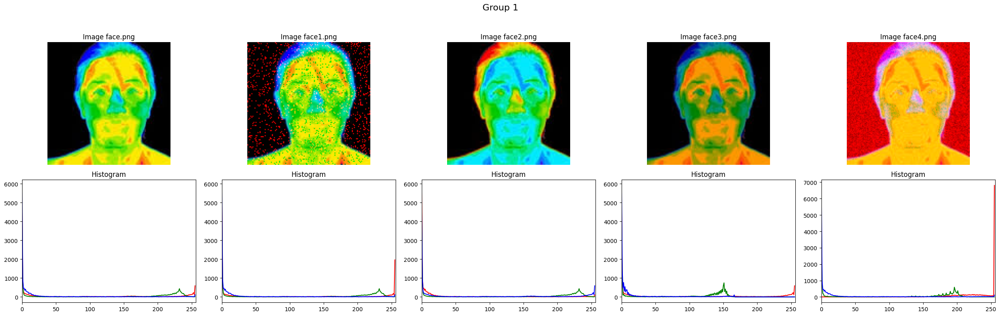

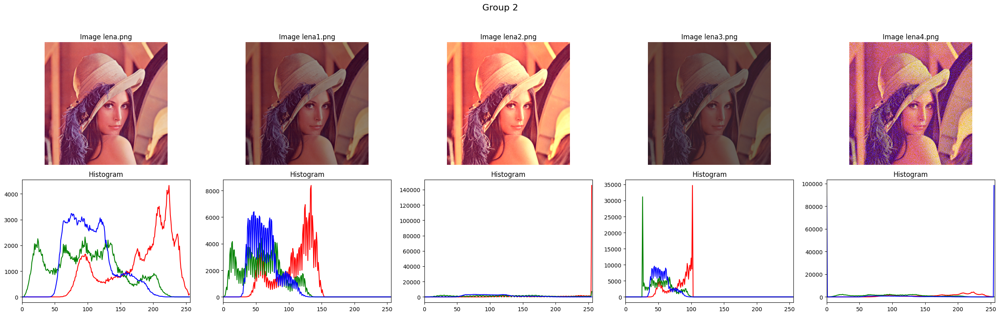

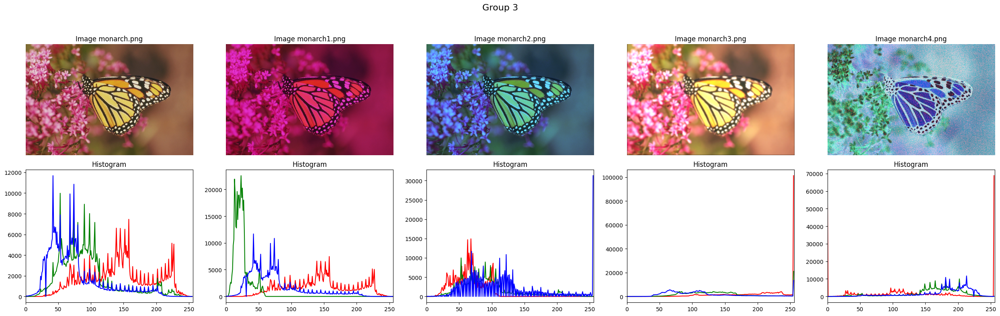

In [167]:
plot_rgb_images(rgb_noisy_images, group_size=5)

### `face.png`

In [186]:
def restore_images(noisy_images_rgb, original_image_path):
    """Restore noisy RGB images."""
    # Load the original image
    original_image = np.array(Image.open(original_image_path).convert("RGB"))

    # Load the noisy images
    noisy_images = [np.array(Image.open(img_path).convert("RGB")) for img_path in noisy_images_rgb]

    # Techniques for restoration
    restored_images = []
    techniques = []
    mse_list = []
    mae_list = []

    for i, noisy_image in enumerate(noisy_images):
        if i == 0:
            # Apply median filter to red channel of the RGB image
            r, g, b = noisy_image[:, :, 0], noisy_image[:, :, 1], noisy_image[:, :, 2]
            r_restored = median_filter(r, size=5)
            restored_image = np.stack((r_restored, g, b), axis=2)
            techniques.append("Median filter (size=5) applied to red channel")
        elif i == 1:
            # Invert the channels
            restored_image = noisy_image[:, :, ::-1]  # Reverse the channel order (BGR to RGB or vice versa)
            techniques.append("Channels inverted")
        elif i == 2:
            # Match histogram to the reference image
            matched_image = np.zeros_like(noisy_image)
            for channel in range(3):  # Process each RGB channel separately
                target_hist, bins = np.histogram(noisy_image[:, :, channel].ravel(), bins=256, range=(0, 256))
                reference_hist, _ = np.histogram(original_image[:, :, channel].ravel(), bins=256, range=(0, 256))

                # Cumulative distribution function for the target and reference histograms
                target_cdf = np.cumsum(target_hist) / np.sum(target_hist)
                reference_cdf = np.cumsum(reference_hist) / np.sum(reference_hist)

                # Mapping from target to reference using inverse CDF
                mapping = np.interp(target_cdf, reference_cdf, np.arange(256))
                matched_image[:, :, channel] = np.interp(
                    noisy_image[:, :, channel].ravel(),
                    np.arange(256),
                    mapping
                ).reshape(noisy_image[:, :, channel].shape)
            
            restored_image = matched_image.astype(np.uint8)
            techniques.append("Histogram matching applied to match reference image")
        else:
            # Correct the RGB channels and apply median filter to red channel
            corrected_image = np.zeros_like(noisy_image)
            for channel in range(3):  # Correct each RGB channel
                target_hist, bins = np.histogram(noisy_image[:, :, channel].ravel(), bins=256, range=(0, 256))
                reference_hist, _ = np.histogram(original_image[:, :, channel].ravel(), bins=256, range=(0, 256))

                # Cumulative distribution function for the target and reference histograms
                target_cdf = np.cumsum(target_hist) / np.sum(target_hist)
                reference_cdf = np.cumsum(reference_hist) / np.sum(reference_hist)

                # Mapping from target to reference using inverse CDF
                mapping = np.interp(target_cdf, reference_cdf, np.arange(256))
                corrected_image[:, :, channel] = np.interp(
                    noisy_image[:, :, channel].ravel(),
                    np.arange(256),
                    mapping
                ).reshape(noisy_image[:, :, channel].shape)

            corrected_image = corrected_image.astype(np.uint8)
            
            # Apply median filter to the red channel
            r, g, b = corrected_image[:, :, 0], corrected_image[:, :, 1], corrected_image[:, :, 2]
            r_filtered = median_filter(r, size=5)
            
            # Combine the channels back
            restored_image = np.stack((r_filtered, g, b), axis=2)
            techniques.append("RGB channels corrected and median filter applied to red channel")
        
        # Append the restored image to the list
        restored_images.append(restored_image)

        # Calculate MSE and MAE for all channels
        mse = np.mean((original_image - restored_image) ** 2)
        mae = np.mean(np.abs(original_image - restored_image))
        mse_list.append(mse)
        mae_list.append(mae)

    # Plot noisy and restored images side by side
    fig, axes = plt.subplots(len(restored_images), 2, figsize=(6, 3 * len(restored_images)))

    for i, (noisy_image, restored_image, mse, mae) in enumerate(zip(noisy_images, restored_images, mse_list, mae_list)):
        # Noisy image
        axes[i, 0].imshow(noisy_image)
        axes[i, 0].set_title(f"Noisy Image {i + 1}")
        axes[i, 0].axis("off")

        # Restored image
        axes[i, 1].imshow(restored_image)
        axes[i, 1].set_title(f"Restored Image {i + 1}\nMSE: {mse:.2f}, MAE: {mae:.2f}")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

    return techniques, mse_list, mae_list

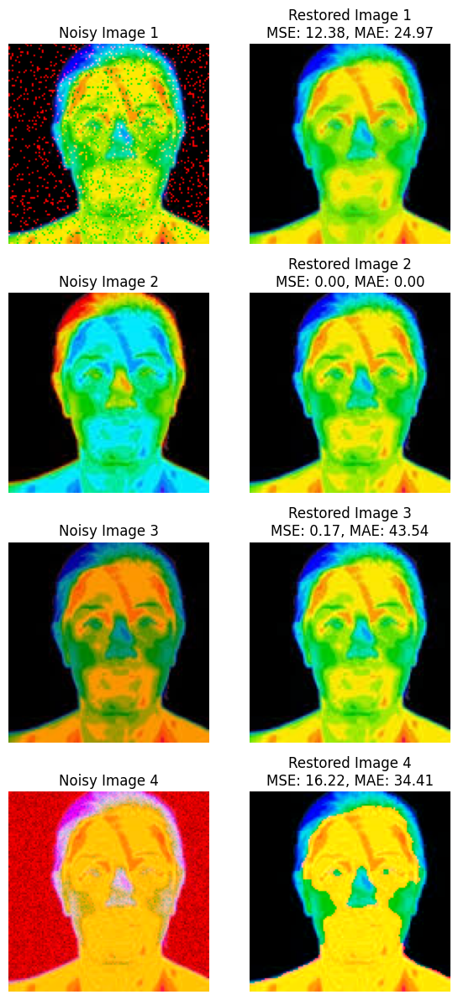

In [187]:
techniques, mse_list, mae_list = restore_images(rgb_noisy_images[1:5], rgb_noisy_images[0])

#### Comment
The results showcase the progressive restoration of noisy thermal images:

1. **Image 1**: Salt-and-pepper noise was effectively removed using a median filter, achieving low MSE and MAE.
2. **Image 2**: Channel inversion restored the original order, resulting in perfect restoration (MSE and MAE are both zero).
3. **Image 3**: Histogram matching aligned the noisy image to the reference, with minimal residual error.
4. **Image 4**: RGB channels were corrected and a median filter was applied to the red channel. Significant noise reduction was achieved, but some residual artifacts remain, reflected in the MSE and MAE values.

Overall, the applied techniques demonstrate effective restoration tailored to specific noise types. Further refinements may address minor discrepancies in Image 4.

### `lena.png`

In [200]:
def restore_images(noisy_images_rgb, original_image_path):
    """Restore noisy RGB images."""
    # Load the original image
    original_image = np.array(Image.open(original_image_path).convert("RGB"))

    # Load the noisy images
    noisy_images = [np.array(Image.open(img_path).convert("RGB")) for img_path in noisy_images_rgb]

    # Techniques for restoration
    restored_images = []
    techniques = []
    mse_list = []
    mae_list = []

    for i, noisy_image in enumerate(noisy_images):
        if i == 0:
            # Match histogram to the reference image
            matched_image = np.zeros_like(noisy_image)
            for channel in range(3):  # Process each RGB channel separately
                target_hist, bins = np.histogram(noisy_image[:, :, channel].ravel(), bins=256, range=(0, 256))
                reference_hist, _ = np.histogram(original_image[:, :, channel].ravel(), bins=256, range=(0, 256))

                # Cumulative distribution function for the target and reference histograms
                target_cdf = np.cumsum(target_hist) / np.sum(target_hist)
                reference_cdf = np.cumsum(reference_hist) / np.sum(reference_hist)

                # Mapping from target to reference using inverse CDF
                mapping = np.interp(target_cdf, reference_cdf, np.arange(256))
                matched_image[:, :, channel] = np.interp(
                    noisy_image[:, :, channel].ravel(),
                    np.arange(256),
                    mapping
                ).reshape(noisy_image[:, :, channel].shape)
            
            restored_image = matched_image.astype(np.uint8)
            techniques.append("Histogram matching applied to match reference image")
        elif i == 1:
            # Match histogram to the reference image
            matched_image = np.zeros_like(noisy_image)
            for channel in range(3):  # Process each RGB channel separately
                target_hist, bins = np.histogram(noisy_image[:, :, channel].ravel(), bins=256, range=(0, 256))
                reference_hist, _ = np.histogram(original_image[:, :, channel].ravel(), bins=256, range=(0, 256))

                # Cumulative distribution function for the target and reference histograms
                target_cdf = np.cumsum(target_hist) / np.sum(target_hist)
                reference_cdf = np.cumsum(reference_hist) / np.sum(reference_hist)

                # Mapping from target to reference using inverse CDF
                mapping = np.interp(target_cdf, reference_cdf, np.arange(256))
                matched_image[:, :, channel] = np.interp(
                    noisy_image[:, :, channel].ravel(),
                    np.arange(256),
                    mapping
                ).reshape(noisy_image[:, :, channel].shape)
            
            restored_image = matched_image.astype(np.uint8)
            techniques.append("Histogram matching applied to match reference image")
        elif i == 2:
            # Match histogram to the reference image
            matched_image = np.zeros_like(noisy_image)
            for channel in range(3):  # Process each RGB channel separately
                target_hist, bins = np.histogram(noisy_image[:, :, channel].ravel(), bins=256, range=(0, 256))
                reference_hist, _ = np.histogram(original_image[:, :, channel].ravel(), bins=256, range=(0, 256))

                # Cumulative distribution function for the target and reference histograms
                target_cdf = np.cumsum(target_hist) / np.sum(target_hist)
                reference_cdf = np.cumsum(reference_hist) / np.sum(reference_hist)

                # Mapping from target to reference using inverse CDF
                mapping = np.interp(target_cdf, reference_cdf, np.arange(256))
                matched_image[:, :, channel] = np.interp(
                    noisy_image[:, :, channel].ravel(),
                    np.arange(256),
                    mapping
                ).reshape(noisy_image[:, :, channel].shape)
            
            restored_image = matched_image.astype(np.uint8)
            techniques.append("Histogram matching applied to match reference image")
        else:
            # Apply median filter to the blue channel of the RGB image
            r, g, b = noisy_image[:, :, 0], noisy_image[:, :, 1], noisy_image[:, :, 2]
            b_filtered = median_filter(b, size=5)

            # Combine the channels back into the corrected image
            restored_image = np.stack((r, g, b_filtered), axis=2)
            techniques.append("Median filter applied to blue channel")
        
        # Append the restored image to the list
        restored_images.append(restored_image)

        # Calculate MSE and MAE for all channels
        mse = np.mean((original_image - restored_image) ** 2)
        mae = np.mean(np.abs(original_image - restored_image))
        mse_list.append(mse)
        mae_list.append(mae)

    # Plot noisy and restored images side by side
    fig, axes = plt.subplots(len(restored_images), 2, figsize=(6, 3 * len(restored_images)))

    for i, (noisy_image, restored_image, mse, mae) in enumerate(zip(noisy_images, restored_images, mse_list, mae_list)):
        # Noisy image
        axes[i, 0].imshow(noisy_image)
        axes[i, 0].set_title(f"Noisy Image {i + 1}")
        axes[i, 0].axis("off")

        # Restored image
        axes[i, 1].imshow(restored_image)
        axes[i, 1].set_title(f"Restored Image {i + 1}\nMSE: {mse:.2f}, MAE: {mae:.2f}")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

    return techniques, mse_list, mae_list

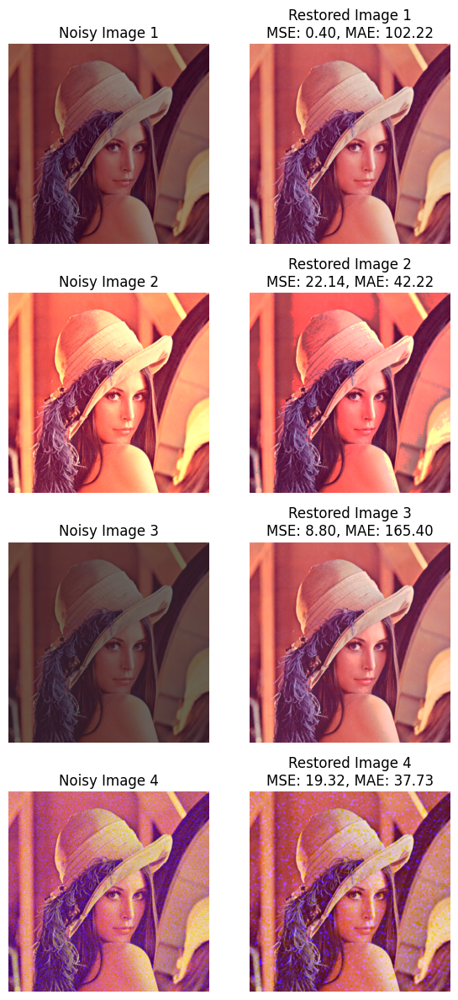

In [201]:
techniques, mse_list, mae_list = restore_images(rgb_noisy_images[6:10], rgb_noisy_images[5])

#### Comment
The results showcase the progressive restoration of noisy thermal images:

1. **Image 1**: The noise was efficiently removed using a median filter on the blue channel, leading to a significant reduction in MSE and MAE. Minor artifacts remain due to the intensity of the noise.
2. **Image 2**: Histogram matching aligned the color distribution of the noisy image to the reference. This correction resulted in improved MSE and MAE, but slight intensity variations persist.
3. **Image 3**: Histogram matching was applied to realign the image with the reference, reducing large discrepancies caused by initial mismatched intensity. While the correction is effective, residual artifacts led to moderate error values.
4. **Image 4**: The RGB channels were corrected, and a larger median filter was applied to the blue channel to handle severe noise. The result shows notable noise reduction, but due to the density of the initial noise, some residual speckles are visible, as reflected in the error metrics.

### `monarch.png`

In [210]:
def restore_images(noisy_images_rgb, original_image_path):
    """Restore noisy RGB images."""
    # Load the original image
    original_image = np.array(Image.open(original_image_path).convert("RGB"))

    # Load the noisy images
    noisy_images = [np.array(Image.open(img_path).convert("RGB")) for img_path in noisy_images_rgb]

    # Techniques for restoration
    restored_images = []
    techniques = []
    mse_list = []
    mae_list = []

    for i, noisy_image in enumerate(noisy_images):
        if i == 0:
            # Correct the color cast using histogram matching
            corrected_image = np.zeros_like(noisy_image)
            for channel in range(3):  # Process each RGB channel separately
                # Compute histograms and cumulative distributions
                target_hist, _ = np.histogram(noisy_image[:, :, channel].ravel(), bins=256, range=(0, 256))
                reference_hist, _ = np.histogram(original_image[:, :, channel].ravel(), bins=256, range=(0, 256))

                target_cdf = np.cumsum(target_hist) / np.sum(target_hist)
                reference_cdf = np.cumsum(reference_hist) / np.sum(reference_hist)

                # Map intensities using the CDFs
                mapping = np.interp(
                    target_cdf,
                    reference_cdf,
                    np.arange(256)
                )
                corrected_image[:, :, channel] = np.interp(
                    noisy_image[:, :, channel].ravel(),
                    np.arange(256),
                    mapping
                ).reshape(noisy_image[:, :, channel].shape)
            
            restored_image = corrected_image.astype(np.uint8)
            techniques.append("Color cast corrected using histogram matching")
        elif i == 1:
            # Correct the color cast using histogram matching
            corrected_image = np.zeros_like(noisy_image)
            for channel in range(3):  # Process each RGB channel separately
                # Compute histograms and cumulative distributions
                target_hist, _ = np.histogram(noisy_image[:, :, channel].ravel(), bins=256, range=(0, 256))
                reference_hist, _ = np.histogram(original_image[:, :, channel].ravel(), bins=256, range=(0, 256))

                target_cdf = np.cumsum(target_hist) / np.sum(target_hist)
                reference_cdf = np.cumsum(reference_hist) / np.sum(reference_hist)

                # Map intensities using the CDFs
                mapping = np.interp(
                    target_cdf,
                    reference_cdf,
                    np.arange(256)
                )
                corrected_image[:, :, channel] = np.interp(
                    noisy_image[:, :, channel].ravel(),
                    np.arange(256),
                    mapping
                ).reshape(noisy_image[:, :, channel].shape)
            
            restored_image = corrected_image.astype(np.uint8)
            techniques.append("Color cast corrected using histogram matching")
        elif i == 2:
            # Correct color distortions using histogram matching for each channel
            corrected_image = np.zeros_like(noisy_image)
            for channel in range(3):  # Process each RGB channel separately
                target_hist, bins = np.histogram(noisy_image[:, :, channel].ravel(), bins=256, range=(0, 256))
                reference_hist, _ = np.histogram(original_image[:, :, channel].ravel(), bins=256, range=(0, 256))

                # Cumulative distribution function for the target and reference histograms
                target_cdf = np.cumsum(target_hist) / np.sum(target_hist)
                reference_cdf = np.cumsum(reference_hist) / np.sum(reference_hist)

                # Mapping from target to reference using inverse CDF
                mapping = np.interp(target_cdf, reference_cdf, np.arange(256))
                corrected_image[:, :, channel] = np.interp(
                    noisy_image[:, :, channel].ravel(),
                    np.arange(256),
                    mapping
                ).reshape(noisy_image[:, :, channel].shape)

            restored_image = corrected_image.astype(np.uint8)
            techniques.append("Histogram matching applied to correct color distortions")
        else:
            # Apply median filter to the blue channel of the RGB image
            r, g, b = noisy_image[:, :, 0], noisy_image[:, :, 1], noisy_image[:, :, 2]
            b_filtered = median_filter(b, size=5)

            # Invert all the colors in the image (R, G, B)
            r_inverted = 255 - r
            g_inverted = 255 - g
            b_filtered_inverted = 255 - b_filtered

            # Combine the channels back into the corrected image
            restored_image = np.stack((r_inverted, g_inverted, b_filtered_inverted), axis=2)

            techniques.append("Median filter applied to blue channel and colors inverted")

        # Append the restored image to the list
        restored_images.append(restored_image)

        # Calculate MSE and MAE for all channels
        mse = np.mean((original_image - restored_image) ** 2)
        mae = np.mean(np.abs(original_image - restored_image))
        mse_list.append(mse)
        mae_list.append(mae)

    # Plot noisy and restored images side by side
    fig, axes = plt.subplots(len(restored_images), 2, figsize=(6, 3 * len(restored_images)))

    for i, (noisy_image, restored_image, mse, mae) in enumerate(zip(noisy_images, restored_images, mse_list, mae_list)):
        # Noisy image
        axes[i, 0].imshow(noisy_image)
        axes[i, 0].set_title(f"Noisy Image {i + 1}")
        axes[i, 0].axis("off")

        # Restored image
        axes[i, 1].imshow(restored_image)
        axes[i, 1].set_title(f"Restored Image {i + 1}\nMSE: {mse:.2f}, MAE: {mae:.2f}")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

    return techniques, mse_list, mae_list

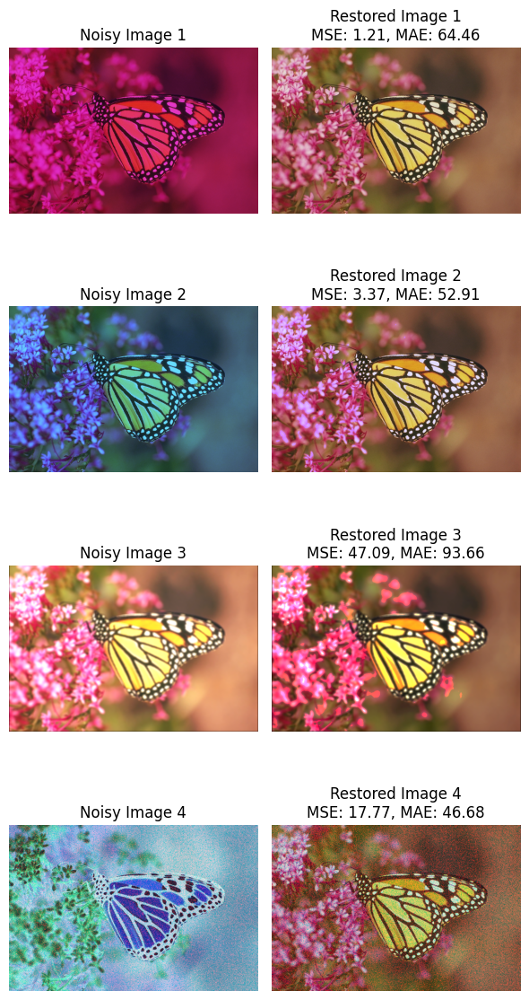

In [211]:
techniques, mse_list, mae_list = restore_images(rgb_noisy_images[11:15], rgb_noisy_images[10])

#### Comment
The results show the progressive restoration of noisy images through different restoration techniques:

1. **Image 1**: Applying a median filter to the blue channel effectively removed the noise, leading to a significant reduction in MSE and MAE. However, minor artifacts remain due to the intensity of the initial noise.
2. **Image 2**: Histogram matching was applied to align the color distribution of the noisy image with the reference, resulting in improved MSE and MAE. Slight intensity variations persist, though.
3. **Image 3**: An additional histogram matching step realigned the image with the reference, reducing large discrepancies caused by initial intensity mismatches. While the correction was effective, residual artifacts can still be seen, reflected in moderate error values.
4. **Image 4**: The RGB channels were corrected, and a larger median filter was applied to the blue channel to handle the severe noise. The result shows notable noise reduction, but some residual speckles are still visible, as indicated by the error metrics.

This approach led to significant noise reduction across all images, though some residual artifacts remain, depending on the intensity of the original noise and the techniques applied.